In [33]:
#Import packeges
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import sklearn
import datetime 
import graphviz

from pandas import DataFrame
from sklearn import linear_model
from sklearn import metrics
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
#from mlxtend.evaluate import bias_variance_decomp
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import KFold, cross_val_score
from sklearn import tree
from datetime import date
from datetime import time

In [5]:
# load data
data = pd.read_csv('Predict Price of Airline Tickets.csv')
data.head()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR ? DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU ? IXR ? BBI ? BLR,05:50,13:15,7h 25m,2 stops,No info,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL ? LKO ? BOM ? COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU ? NAG ? BLR,18:05,23:30,5h 25m,1 stop,No info,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR ? NAG ? DEL,16:50,21:35,4h 45m,1 stop,No info,13302


# Summary statistics

In [11]:
data.info()
data.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10683 entries, 0 to 10682
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Airline          10683 non-null  object
 1   Date_of_Journey  10683 non-null  object
 2   Source           10683 non-null  object
 3   Destination      10683 non-null  object
 4   Route            10682 non-null  object
 5   Dep_Time         10683 non-null  object
 6   Arrival_Time     10683 non-null  object
 7   Duration         10683 non-null  object
 8   Total_Stops      10682 non-null  object
 9   Additional_Info  10683 non-null  object
 10  Price            10683 non-null  int64 
dtypes: int64(1), object(10)
memory usage: 918.2+ KB


(10683, 11)

In [12]:
data.describe(include='all')

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
count,10683,10683,10683,10683,10682,10683,10683,10683,10682,10683,10683.000000
unique,12,44,5,6,128,222,1343,368,5,10,NaN
top,Jet Airways,18/05/2019,Delhi,Cochin,DEL ? BOM ? COK,18:55,19:00,2h 50m,1 stop,No info,NaN
freq,3849,504,4537,4537,2376,233,423,550,5625,8345,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9087.064121
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4611.359167
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1759.000000
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5277.000000
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8372.000000
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12373.000000


In [6]:
#data['year'] = pd.DatetimeIndex(data['Date_of_Journey']).year
data['month'] = pd.DatetimeIndex(data['Date_of_Journey']).month
data['day'] = pd.DatetimeIndex(data['Date_of_Journey']).day
data

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,month,day
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR ? DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897,3,24
1,Air India,1/05/2019,Kolkata,Banglore,CCU ? IXR ? BBI ? BLR,05:50,13:15,7h 25m,2 stops,No info,7662,1,5
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL ? LKO ? BOM ? COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882,9,6
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU ? NAG ? BLR,18:05,23:30,5h 25m,1 stop,No info,6218,12,5
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR ? NAG ? DEL,16:50,21:35,4h 45m,1 stop,No info,13302,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10678,Air Asia,9/04/2019,Kolkata,Banglore,CCU ? BLR,19:55,22:25,2h 30m,non-stop,No info,4107,9,4
10679,Air India,27/04/2019,Kolkata,Banglore,CCU ? BLR,20:45,23:20,2h 35m,non-stop,No info,4145,4,27
10680,Jet Airways,27/04/2019,Banglore,Delhi,BLR ? DEL,08:20,11:20,3h,non-stop,No info,7229,4,27
10681,Vistara,01/03/2019,Banglore,New Delhi,BLR ? DEL,11:30,14:10,2h 40m,non-stop,No info,12648,1,3


In [14]:
data.isna().sum()#.sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              1
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        1
Additional_Info    0
Price              0
month              0
day                0
dtype: int64

In [7]:
## Encoder data 

le = LabelEncoder()

data_LE = data.apply(le.fit_transform)

data_LE.head()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,month,day
0,3,24,0,5,18,211,233,240,4,8,65,1,7
1,1,6,3,0,84,31,906,336,1,8,669,0,2
2,4,43,2,1,118,70,413,106,1,8,1537,5,3
3,3,10,3,0,91,164,1324,311,0,8,389,6,2
4,3,0,0,5,29,149,1237,303,0,8,1457,0,0


In [16]:
data_LE.describe(include='all')

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,month,day
count,10683.000000,10683.000000,10683.000000,10683.000000,10683.000000,10683.000000,10683.000000,10683.000000,10683.000000,10683.000000,10683.000000,10683.000000,10683.000000
mean,3.965927,23.735093,1.952261,1.436113,74.825143,107.980717,869.828419,194.069269,1.458579,7.393054,810.459234,3.013854,3.847515
std,2.352155,12.337763,1.177221,1.474782,36.730924,61.085563,331.509504,108.620556,1.806560,1.214211,568.936982,1.828490,2.522704
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,14.000000,2.000000,0.000000,48.000000,55.000000,603.000000,106.000000,0.000000,8.000000,235.000000,1.000000,2.000000
50%,4.000000,24.000000,2.000000,1.000000,73.000000,96.000000,937.000000,233.000000,0.000000,8.000000,795.000000,3.000000,3.000000
75%,4.000000,35.000000,3.000000,2.000000,104.000000,164.000000,1141.000000,280.000000,4.000000,8.000000,1336.000000,4.000000,6.000000
max,11.000000,43.000000,4.000000,5.000000,128.000000,221.000000,1342.000000,367.000000,5.000000,9.000000,1869.000000,6.000000,8.000000


So, what do I know about dataset? The Predict Price of Airline Tickets dataset has 11 columns (features) and 10683, rows (observations,samples).

Numerical columns are:

Price

year,month,day of Date_of_Journey had been spreated to 3 colunm to get thier numerical values

Categorical columns are:

Total_Stops (5 (0,1,2,3,4))

Airline (12,(Jet Airways, IndiGo, Air India, Multiple carriers, SpiceJet, Vistara, Air Asia, GoAir, Multiple carriers Premium economy, Jet Airways Business, Vistara Premium economy, Trujet)

Date_of_Journey (44)

Route (128)

Source (5, (Delhi, Kolkata, Banglore, Mumbai, Chennai))

Destination (6, [Cochin, Banglore, Delhi, New Delhi, Hyderabad, Kolkata])
Duration (368)

# EDA

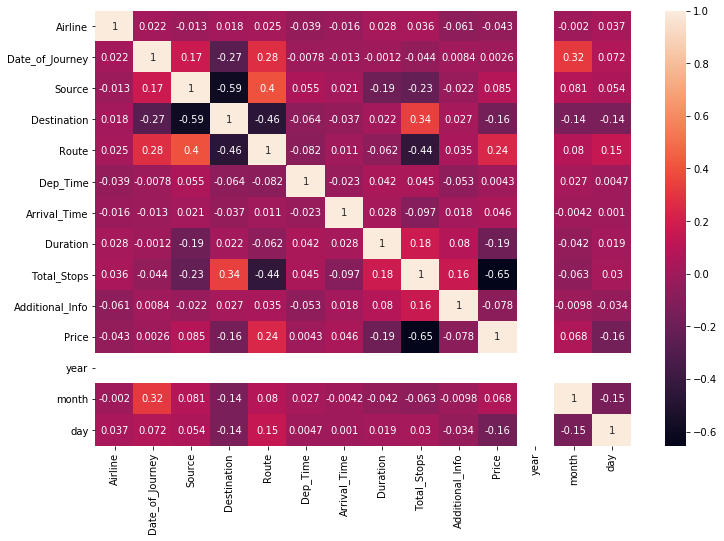

In [11]:
fig, axes = plt.subplots(1, 1, figsize=(12,8)) 
sns.heatmap(data_LE.corr(), annot=True)

can be noitce source, destnaion, route and total stop have a high correlation with price  

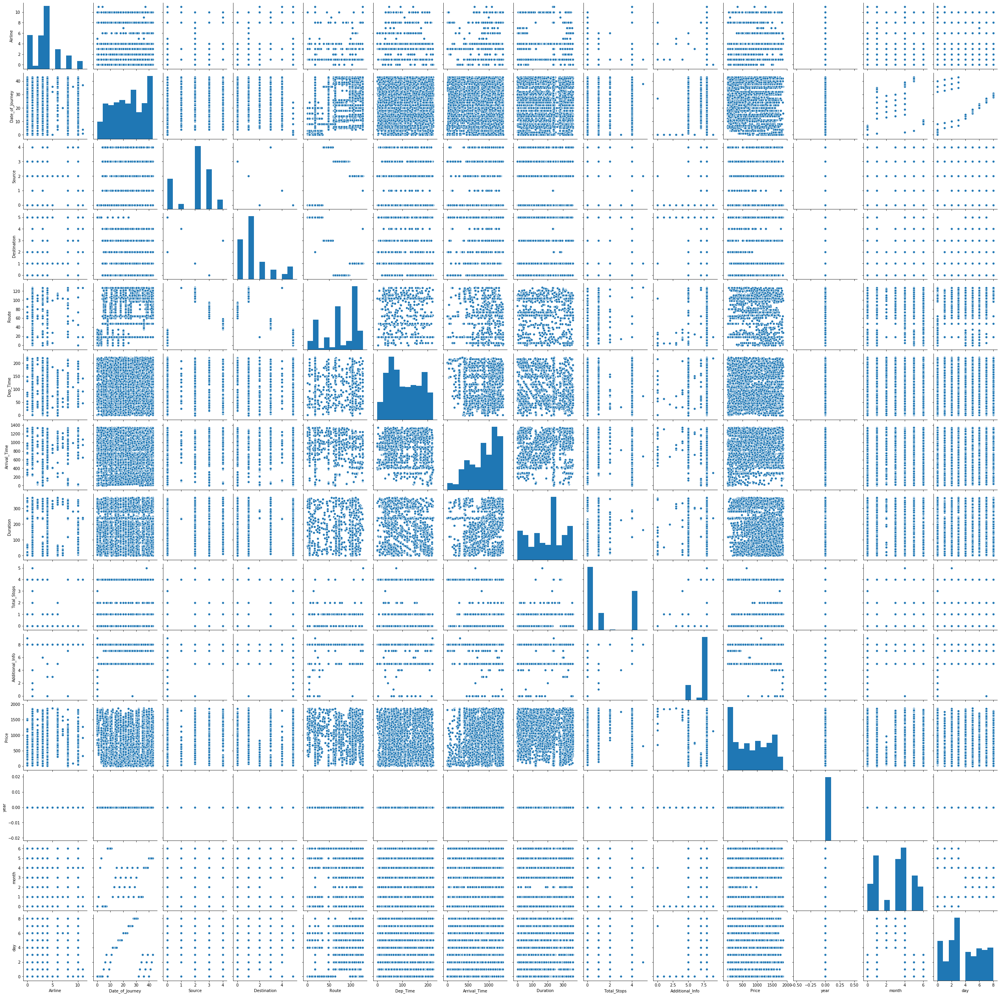

In [26]:
sns.pairplot(data_LE)

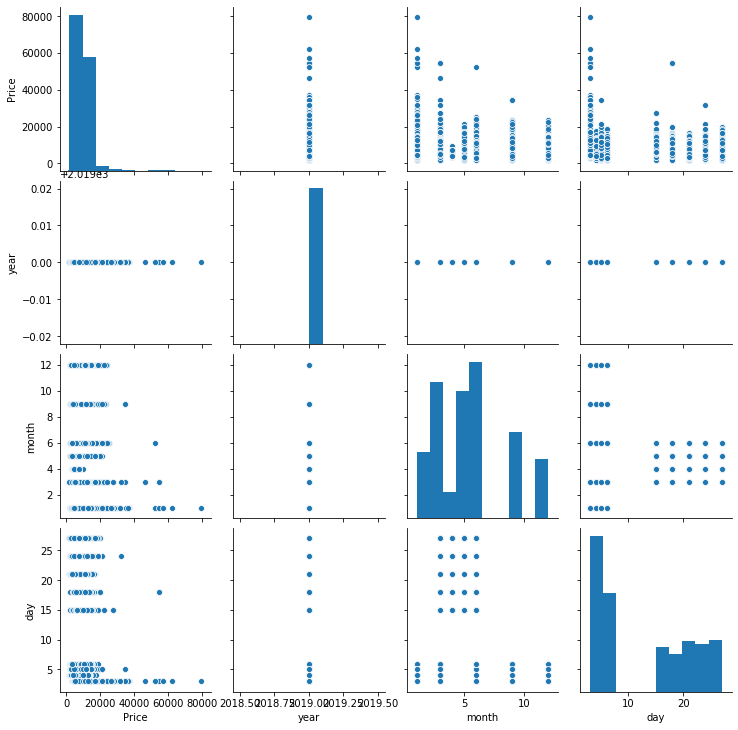

In [27]:
sns.pairplot(data)

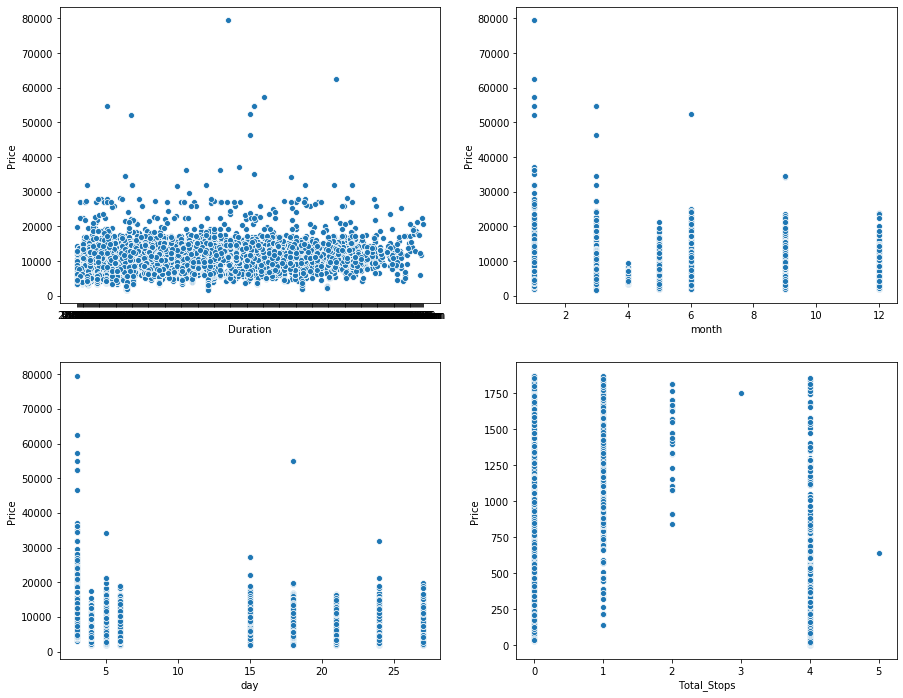

In [32]:
#Relationship between 2 Numerical Variables
fig, axes = plt.subplots(2, 2, figsize=(15,12)) # plot 4 graphs  
sns.scatterplot(x='Duration', y='Price', data=data, ax=axes[0,0])
sns.scatterplot(x ='month', y ='Price', data = data, ax=axes[0,1])
sns.scatterplot(x ='day', y ='Price', data = data, ax=axes[1,0])
sns.scatterplot(x = 'Total_Stops', y = 'Price', data = data_LE)
#Airline	Date_of_Journey	Source	Destination	Route	Dep_Time	Arrival_Time	Duration	Total_Stops	Additional_Info	Price	year	month	day

Text(0.5, 1.0, 'Total_Stops')

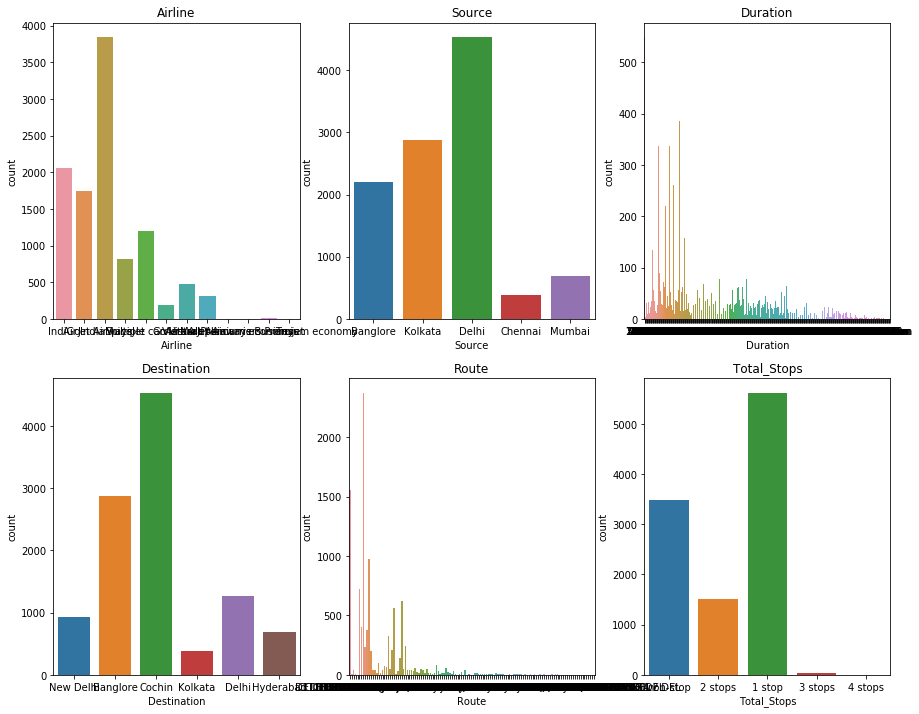

In [29]:
#Categorical Variables
fig, axes = plt.subplots(2, 3, figsize=(15,12)) # plot 6 graphs
sns.countplot(x='Airline', data=data, ax=axes[0,0]).set_title('Airline')
sns.countplot(x='Source', data=data, ax=axes[0,1]).set_title('Source')
sns.countplot(x='Destination', data=data, ax=axes[1,0]).set_title('Destination')
sns.countplot(x='Route', data=data, ax=axes[1,1]).set_title('Route')
sns.countplot(x='Duration', data=data, ax=axes[0,2]).set_title('Duration')
sns.countplot(x='Total_Stops', data=data, ax=axes[1,2]).set_title('Total_Stops')

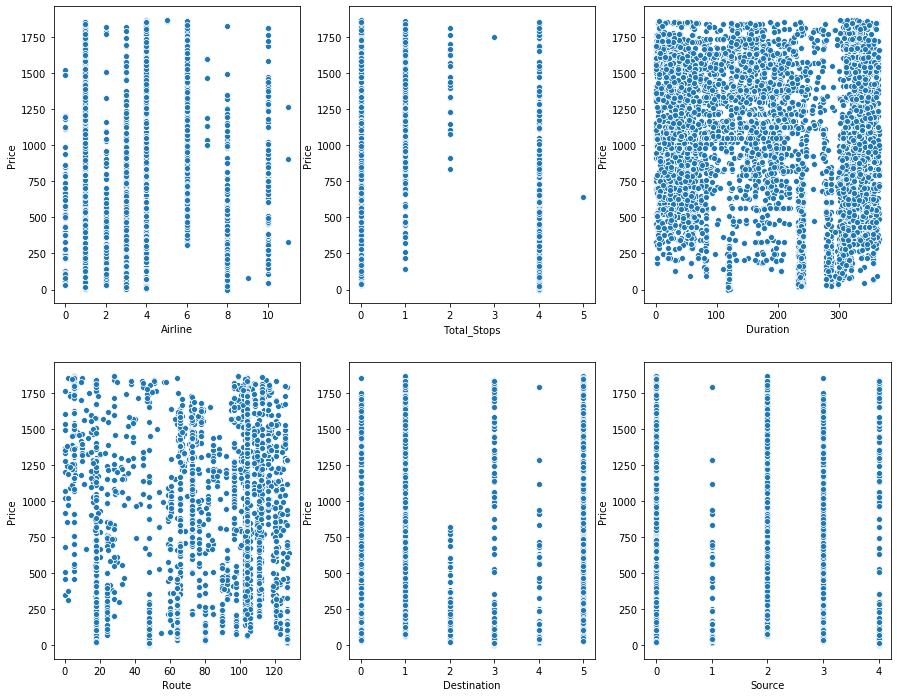

In [19]:
fig, axes = plt.subplots(2, 3, figsize=(15,12)) # plot 6 graphs  
sns.scatterplot(x='Airline', y='Price', data=data_LE, ax=axes[0,0])
sns.scatterplot(x ='Total_Stops', y ='Price', data = data_LE, ax=axes[0,1])
sns.scatterplot(x ='Route', y ='Price', data = data_LE, ax=axes[1,0])
sns.scatterplot(x = 'Destination', y = 'Price', data = data_LE, ax=axes[1,1])
sns.scatterplot(x = 'Source', y = 'Price', data = data_LE, ax=axes[1,2]) 
sns.scatterplot(x = 'Duration', y = 'Price', data = data_LE, ax=axes[0,2]) 

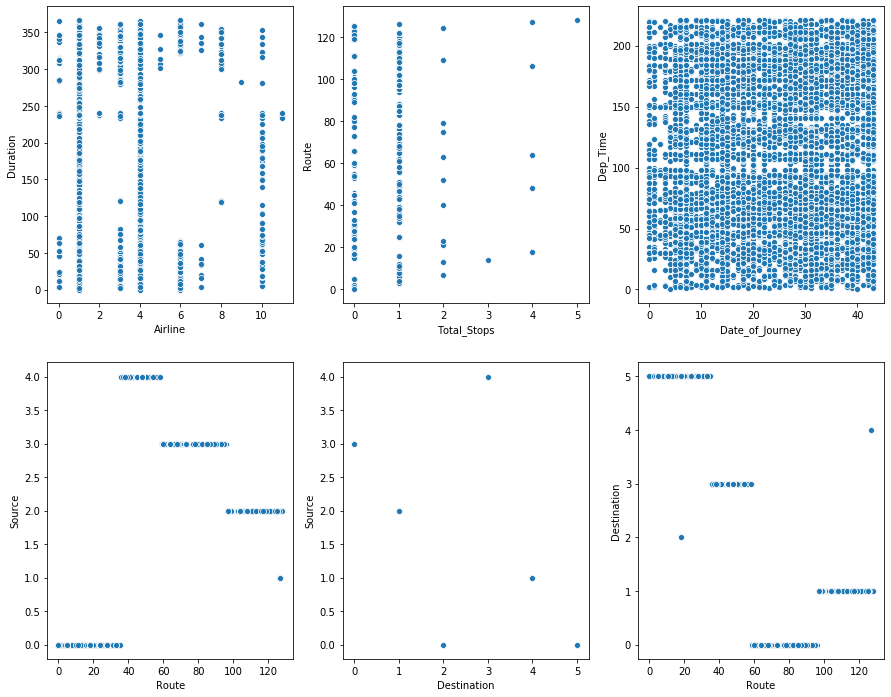

In [20]:
fig, axes = plt.subplots(2, 3, figsize=(15,12)) # plot 6 graphs  
sns.scatterplot(x='Airline', y='Duration', data=data_LE, ax=axes[0,0])
sns.scatterplot(x ='Total_Stops', y ='Route', data = data_LE, ax=axes[0,1])
sns.scatterplot(x ='Route', y ='Source', data = data_LE, ax=axes[1,0])
sns.scatterplot(x = 'Destination', y = 'Source', data = data_LE, ax=axes[1,1])
sns.scatterplot(x = 'Route', y = 'Destination', data = data_LE, ax=axes[1,2]) 
sns.scatterplot(x = 'Date_of_Journey', y = 'Dep_Time', data = data_LE, ax=axes[0,2]) 

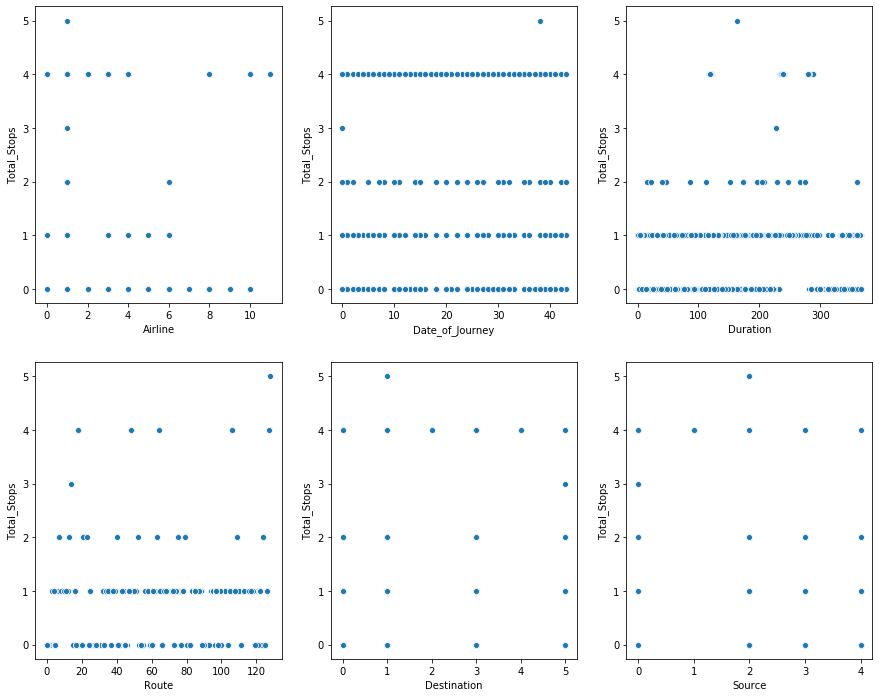

In [21]:
fig, axes = plt.subplots(2, 3, figsize=(15,12)) # plot 6 graphs  
sns.scatterplot(x='Airline', y='Total_Stops', data=data_LE, ax=axes[0,0])
sns.scatterplot(x ='Date_of_Journey', y ='Total_Stops', data = data_LE, ax=axes[0,1])
sns.scatterplot(x ='Route', y ='Total_Stops', data = data_LE, ax=axes[1,0])
sns.scatterplot(x = 'Destination', y = 'Total_Stops', data = data_LE, ax=axes[1,1])
sns.scatterplot(x = 'Source', y = 'Total_Stops', data = data_LE, ax=axes[1,2]) 
sns.scatterplot(x = 'Duration', y = 'Total_Stops', data = data_LE, ax=axes[0,2]) 

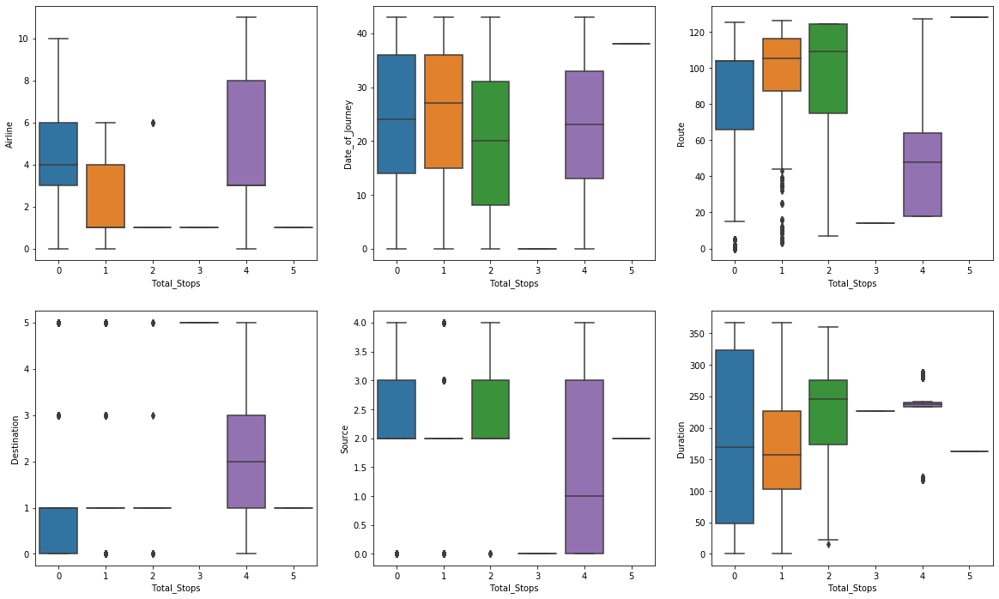

In [31]:
fig, axes = plt.subplots(2, 3, figsize=(20,12)) # plot 6 graphs 
sns.boxplot(data=data_LE, x='Total_Stops', y='Airline', ax=axes[0][0])
sns.boxplot(data=data_LE, x='Total_Stops', y='Date_of_Journey', ax=axes[0][1])
sns.boxplot(data=data_LE, x='Total_Stops', y='Route', ax=axes[0][2])
sns.boxplot(data=data_LE, x='Total_Stops', y='Destination', ax=axes[1][0])
sns.boxplot(data=data_LE, x='Total_Stops', y='Source', ax=axes[1][1])
sns.boxplot(data=data_LE, x='Total_Stops', y='Duration', ax=axes[1][2])

In [ ]:
fig, axes = plt.subplots(2, 3, figsize=(20,12)) # plot 6 graphs 
sns.boxplot(data=data_LE, x='Price', y='Total_Stops', ax=axes[0][0])
sns.boxplot(data=data_LE, x='Price', y='Date_of_Journey', ax=axes[0][1])
sns.boxplot(data=data_LE, x='Price', y='Route', ax=axes[0][2])
sns.boxplot(data=data_LE, x='Price', y='Destination', ax=axes[1][0])
sns.boxplot(data=data_LE, x='Price', y='Source', ax=axes[1][1])
sns.boxplot(data=data_LE, x='Price', y='Duration', ax=axes[1][2])

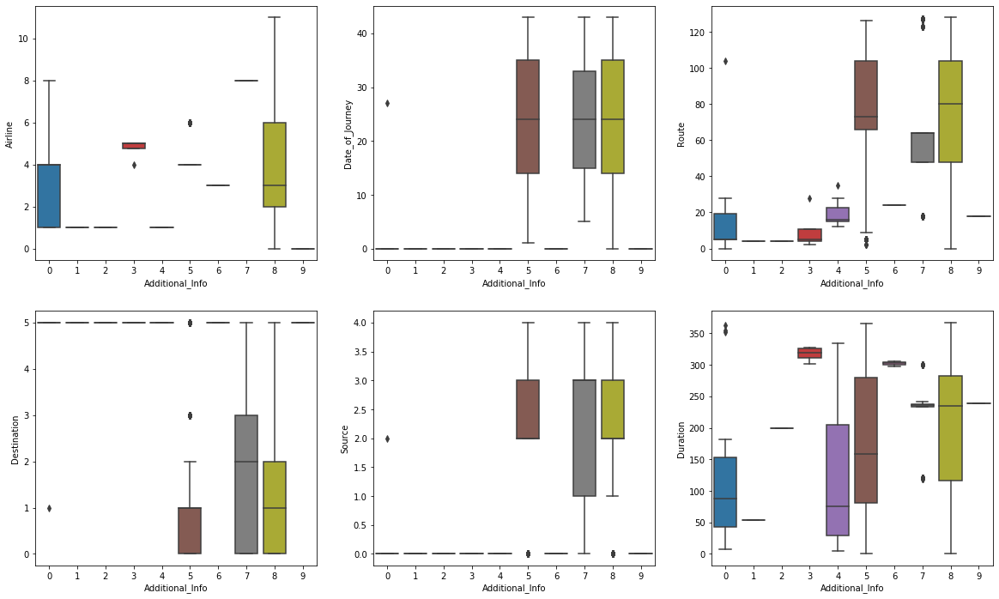

In [29]:
fig, axes = plt.subplots(2, 3, figsize=(20,12)) # plot 6 graphs 
sns.boxplot(data=data_LE, x='Additional_Info', y='Airline', ax=axes[0][0])
sns.boxplot(data=data_LE, x='Additional_Info', y='Date_of_Journey', ax=axes[0][1])
sns.boxplot(data=data_LE, x='Additional_Info', y='Route', ax=axes[0][2])
sns.boxplot(data=data_LE, x='Additional_Info', y='Destination', ax=axes[1][0])
sns.boxplot(data=data_LE, x='Additional_Info', y='Source', ax=axes[1][1])
sns.boxplot(data=data_LE, x='Additional_Info', y='Duration', ax=axes[1][2])

In [22]:
# train_test_split for data
x = data_LE.drop(['Price'],axis=1)
y = data_LE['Price']

x_train,x_test, y_train,y_test  = train_test_split(x,y, test_size=0.33, random_state=42)

#  Decision Tree model 

In [23]:
D_T_regressor = DecisionTreeRegressor()

D_T_regressor.fit(x_train,y_train)

DecisionTreeRegressor()

In [24]:
columns_name = x.columns.tolist()

print(tree.export_text(D_T_regressor,feature_names=columns_name))

|--- Total_Stops <= 3.50
|   |--- Airline <= 3.50
|   |   |--- Total_Stops <= 0.50
|   |   |   |--- day <= 0.50
|   |   |   |   |--- month <= 4.50
|   |   |   |   |   |--- Route <= 107.50
|   |   |   |   |   |   |--- Route <= 103.50
|   |   |   |   |   |   |   |--- Airline <= 1.50
|   |   |   |   |   |   |   |   |--- month <= 0.50
|   |   |   |   |   |   |   |   |   |--- Route <= 68.00
|   |   |   |   |   |   |   |   |   |   |--- Arrival_Time <= 880.00
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 4
|   |   |   |   |   |   |   |   |   |   |--- Arrival_Time >  880.00
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 8
|   |   |   |   |   |   |   |   |   |--- Route >  68.00
|   |   |   |   |   |   |   |   |   |   |--- value: [1823.00]
|   |   |   |   |   |   |   |   |--- month >  0.50
|   |   |   |   |   |   |   |   |   |--- Date_of_Journey <= 1.50
|   |   |   |   |   |   |   |   |   |   |--- Route <= 20.50
|   |   |   |   |   |   |  

In [8]:
tree_fig = tree.export_graphviz(D_T_regressor,feature_names=columns_name, filled=True)

graph = graphviz.Source(tree_fig, format='png')

graph

In [25]:
y_pred = D_T_regressor.predict(x_test)

print('MSE = ', metrics.mean_squared_error(y_test,y_pred))
print('MAE = ', metrics.mean_absolute_error(y_test,y_pred))

MSE =  32040.320657654254
MAE =  82.38972395537908


([<matplotlib.axis.YTick at 0x24c1ca2d6c8>,
 <a list of 12 Text yticklabel objects>)

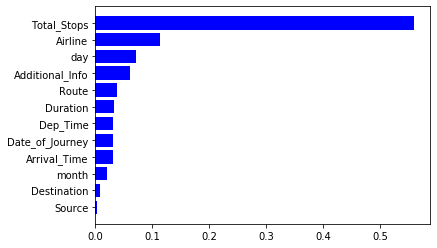

In [26]:
# Importance feature in model
importance = D_T_regressor.feature_importances_

indices = np.argsort(importance)

plt.barh(range(len(indices)), importance[indices], color='b')

plt.yticks(range(len(indices)), [columns_name[i] for i in indices])

# Random forest Regressor Model

In [27]:
regressor = RandomForestRegressor()

regressor.fit(x_train,y_train)

y_pred = regressor.predict(x_test)

In [28]:
MAE  = metrics.mean_absolute_error(y_test,y_pred)
MAPE = metrics.mean_absolute_percentage_error(y_test,y_pred)
MSE = metrics.mean_squared_error(y_test,y_pred)
RMSE = np.sqrt(metrics.mean_squared_error(y_test,y_pred))
R2_SCORE = metrics.r2_score(y_test,y_pred)

print("MAE = ",MAE)
print("MAPE = ",MAPE)
print("MSE = ",MSE)
print("RMSE = ",RMSE)
print("R2_SCORE = ",R2_SCORE)

MAE =  79.82793734075214
MAPE =  10447942414036.172
MSE =  21018.3698897254
RMSE =  144.97713574810822
R2_SCORE =  0.9346380023702184


In [29]:
np.mean(y_test)

797.2753828701078

In [ ]:
for tree_in_forest in regressor.estimators_:
    dot_data = tree.export_graphviz(tree_in_forest, feature_names=x_train.columns.tolist(), out_file=None, filled=True, rounded=True)
    graph = graphviz.Source(dot_data,format='png')
    graph
    
graph.render('Trees', format='png', view=True)

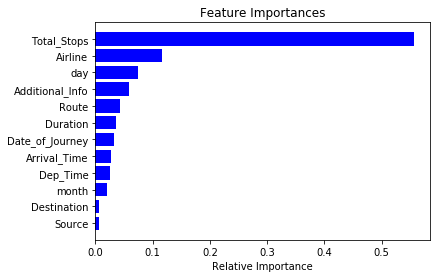

# cross validation

In [51]:
cv_conf = KFold(n_splits= 5, random_state=1, shuffle=True)

scores = cross_val_score(regressor, x, y, cv = cv_conf, scoring='neg_mean_squared_error' )

final_score = np.mean(np.absolute(scores))

print('mean squared Error = ', final_score)
# @ n_splits= 5 mean squared Error=

mean squared Error =  20738.092282531383
